In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import math
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

In [6]:
plt.rcParams['agg.path.chunksize'] = 150

# Combined Data

In [63]:
data = pd.read_csv("data/csv/still/still.csv")
# data = data.sample(frac=0.2)

# data = pd.read_csv("data/csv/still/0/wo_1_1_0.csv")

data.head()

,nc,rssi,rssi1,rssi2,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase,with_receiver,coord1,coord2
0,1,-0.847627,-0.516768,-0.887673,1,0.010022,0.618786,1.632356,0.090399,0,6,2
1,1,-0.847627,-0.516768,-0.887673,2,-0.019491,0.672789,1.613112,0.078000,0,6,2
2,1,-0.847627,-0.516768,-0.887673,3,-0.035476,0.618856,1.575681,0.075098,0,6,2
3,1,-0.847627,-0.516768,-0.887673,4,-0.085177,0.598500,1.568844,0.063920,0,6,2
4,1,-0.847627,-0.516768,-0.887673,5,-0.108754,0.759250,1.580504,0.050930,0,6,2


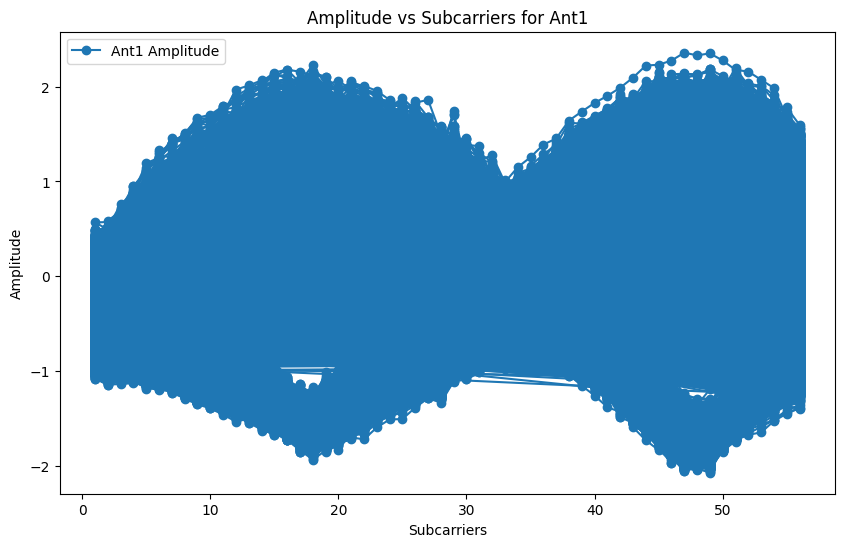

In [64]:
# Plotting the data
plt.figure(figsize=(10, 6))

# Plot Ant1 and Ant2 amplitudes
plt.plot(data["subcarriers"], data["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
# plt.plot(data["subcarriers"], data["ant2_amplitude"], label="Ant2 Amplitude", marker='x')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Amplitude vs Subcarriers for Ant1")
plt.legend()

# Show the plot
plt.show()

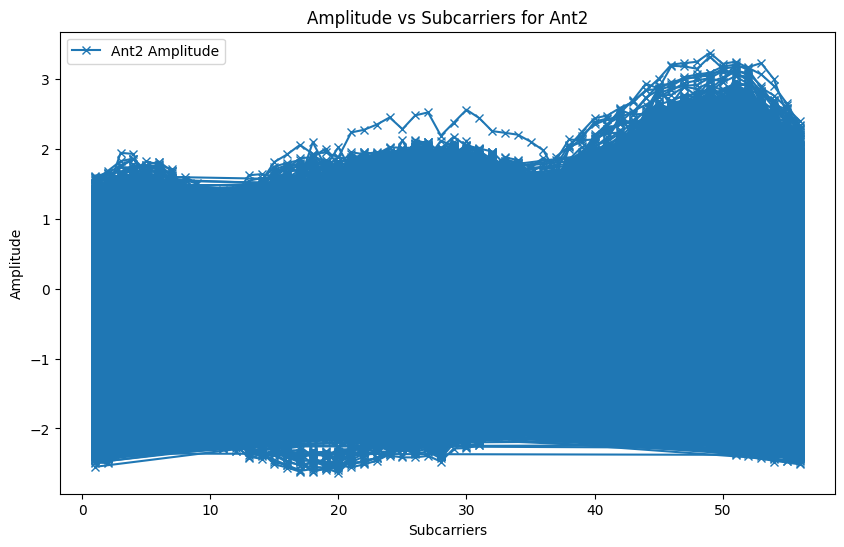

In [65]:
# Plotting the data
plt.figure(figsize=(10, 6))

# Plot Ant1 and Ant2 amplitudes
plt.plot(data["subcarriers"], data["ant2_amplitude"], label="Ant2 Amplitude", marker='x')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Amplitude vs Subcarriers for Ant2")
plt.legend()

# Show the plot
plt.show()

In [10]:
data.plot(subplots=True, layout=(len(data.columns)//2, 2), figsize=(12, 15), sharex=True)
plt.tight_layout()
plt.show()

In [11]:
wo_1_1_0 = pd.read_csv("data/csv/still/0/wo_1_1_0.csv")

wo_1_1_0.head()

,timestamps,csi_len,channel,err_info,noise_floor,rate,bandWidth,num_tones,nr,nc,...,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase,with_receiver,coord1,coord2
0,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,1,27.459060,92.070625,0.992894,-1.418147,0,1,1
1,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,2,27.459060,167.839209,-0.992894,1.994465,0,1,1
2,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,3,28.844410,94.339811,0.982794,-1.485895,0,1,1
3,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,4,29.154759,174.642492,-1.030377,1.983207,0,1,1
4,429192390,560,2437,0,0,140,0,56,2,2,...,1320,1904,5,30.805844,89.453899,0.946773,-1.470015,0,1,1


# Location (1, 1) Round 1

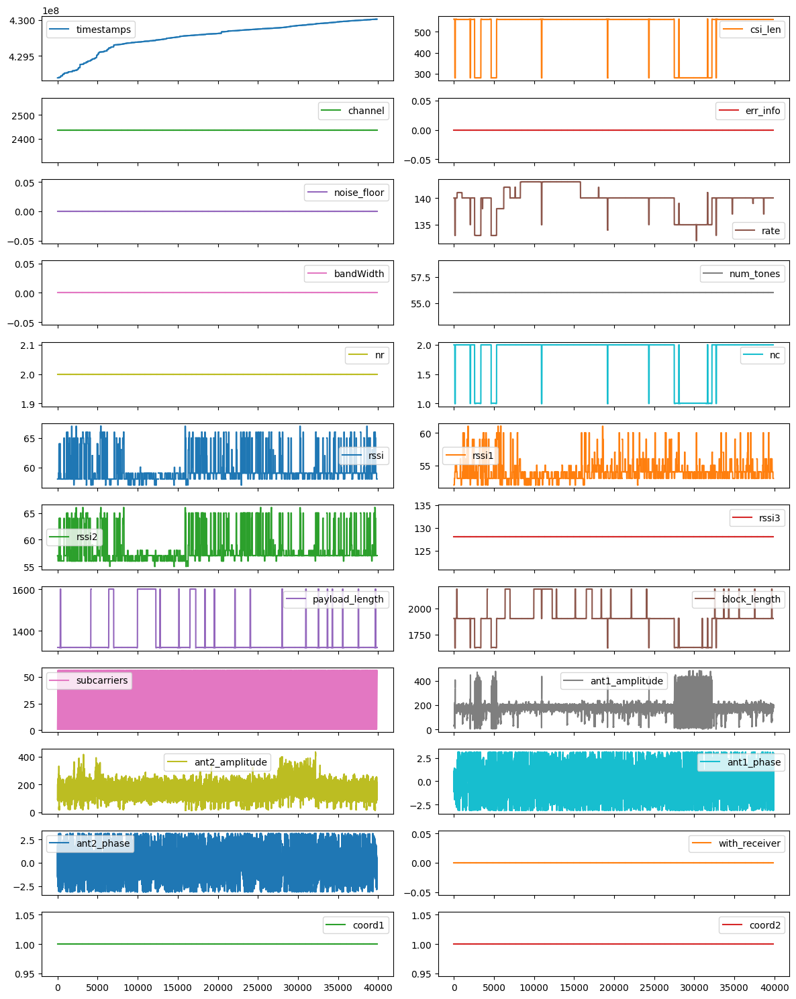

In [12]:
wo_1_1_0.plot(subplots=True, layout=(len(wo_1_1_0.columns)//2, 2), figsize=(12, 15), sharex=True)
plt.tight_layout()
plt.show()

In [13]:
wo_1_1_0.drop(columns=["coord1", "coord2", "with_receiver", "rssi3", "nr", "num_tones", "noise_floor", "channel", "err_info"], inplace=True)
wo_1_1_0.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
0,429192390,560,140,0,2,58,52,57,1320,1904,1,27.459060,92.070625,0.992894,-1.418147
1,429192390,560,140,0,2,58,52,57,1320,1904,2,27.459060,167.839209,-0.992894,1.994465
2,429192390,560,140,0,2,58,52,57,1320,1904,3,28.844410,94.339811,0.982794,-1.485895
3,429192390,560,140,0,2,58,52,57,1320,1904,4,29.154759,174.642492,-1.030377,1.983207
4,429192390,560,140,0,2,58,52,57,1320,1904,5,30.805844,89.453899,0.946773,-1.470015


## Amplitude

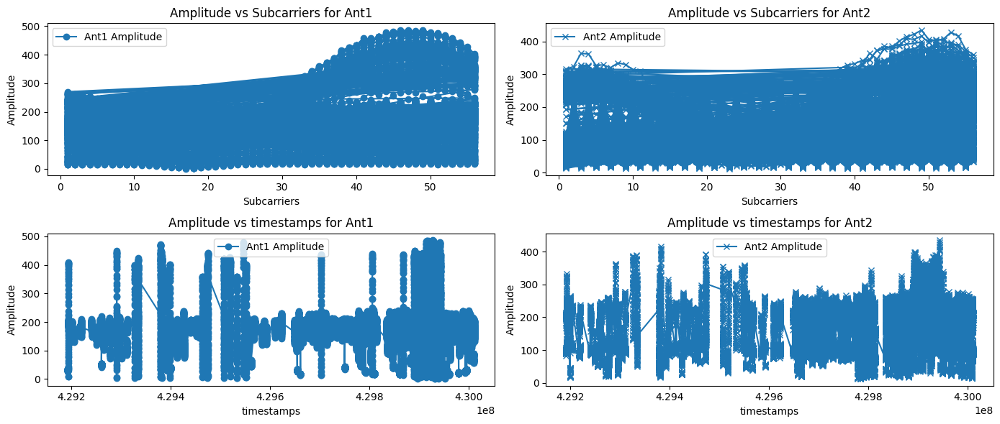

In [14]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("Amplitude vs Subcarriers for Ant1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("Amplitude vs Subcarriers for Ant2")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o')
ax[1][0].set_xlabel("timestamps")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("Amplitude vs timestamps for Ant1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x')
ax[1][1].set_xlabel("timestamps")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("Amplitude vs timestamps for Ant2")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

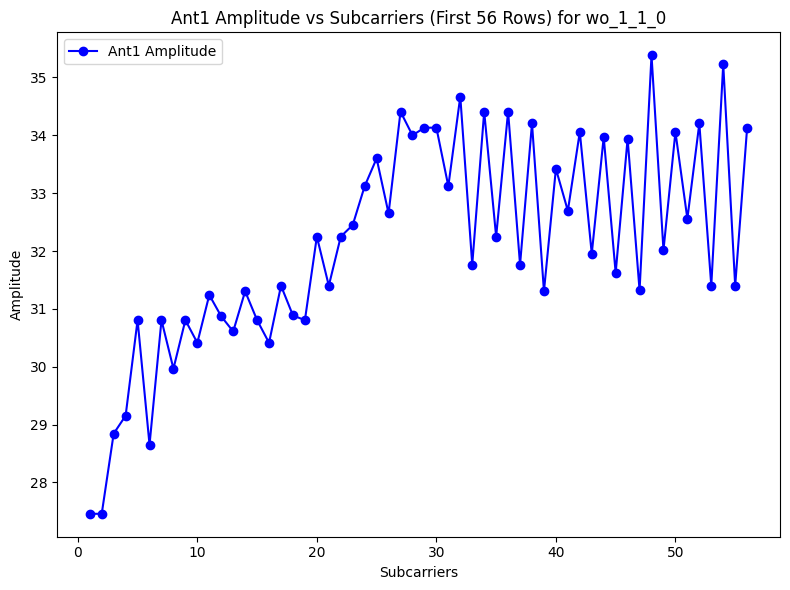

In [15]:
# Plotting Amplitude vs Subcarriers for Ant1 for wo_1_1_0 for only the first 56 rows
plt.figure(figsize=(8, 6))

# Extracting the first 56 rows
subcarriers_first_56 = wo_1_1_0["subcarriers"][:56]
amplitude_ant1_first_56 = wo_1_1_0["ant1_amplitude"][:56]

# Plotting
plt.plot(subcarriers_first_56, amplitude_ant1_first_56, label="Ant1 Amplitude", marker='o', color='blue')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers (First 56 Rows) for wo_1_1_0")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


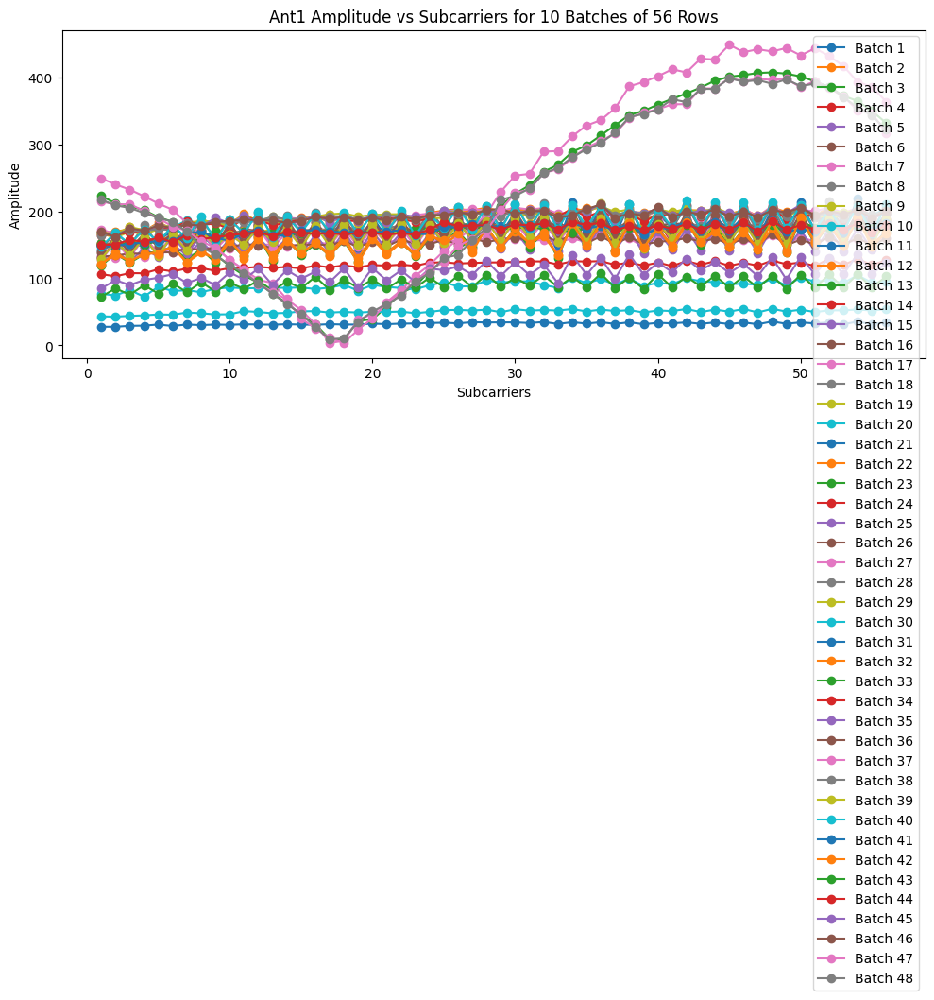

In [16]:
plt.figure(figsize=(10, 8))

# Plot 10 graphs, each containing 56 rows of data
for i in range(48):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_1_1_0["subcarriers"][start:end]
    amplitude_batch = wo_1_1_0["ant1_amplitude"][start:end]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for 10 Batches of 56 Rows")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

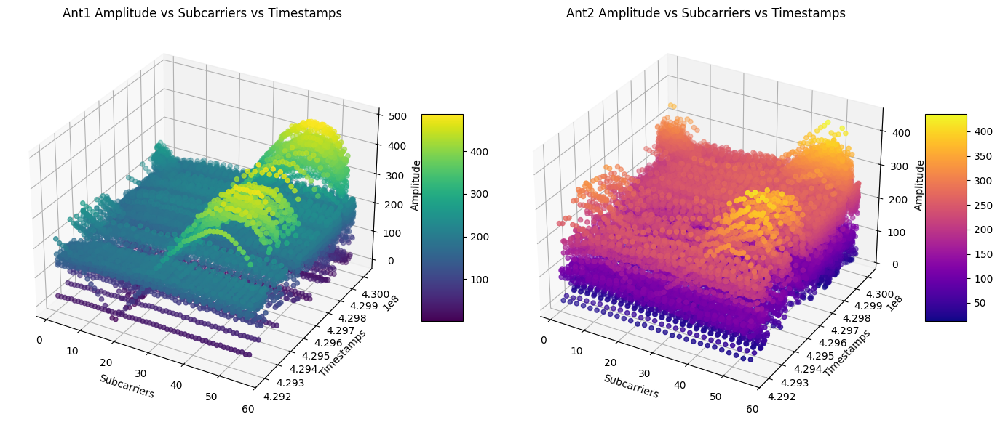

In [17]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Amplitude
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_1_1_0["subcarriers"]
amplitude_ant1 = wo_1_1_0["ant1_amplitude"]
timestamps = wo_1_1_0["timestamps"]

# 3D scatter plot for Ant1
scatter1 = ax1.scatter(subcarriers, timestamps, amplitude_ant1, c=amplitude_ant1, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Amplitude')
ax1.set_title('Ant1 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Amplitude
ax2 = fig.add_subplot(122, projection='3d')
amplitude_ant2 = wo_1_1_0["ant2_amplitude"]

# 3D scatter plot for Ant2
scatter2 = ax2.scatter(subcarriers, timestamps, amplitude_ant2, c=amplitude_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('Ant2 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

## Phase

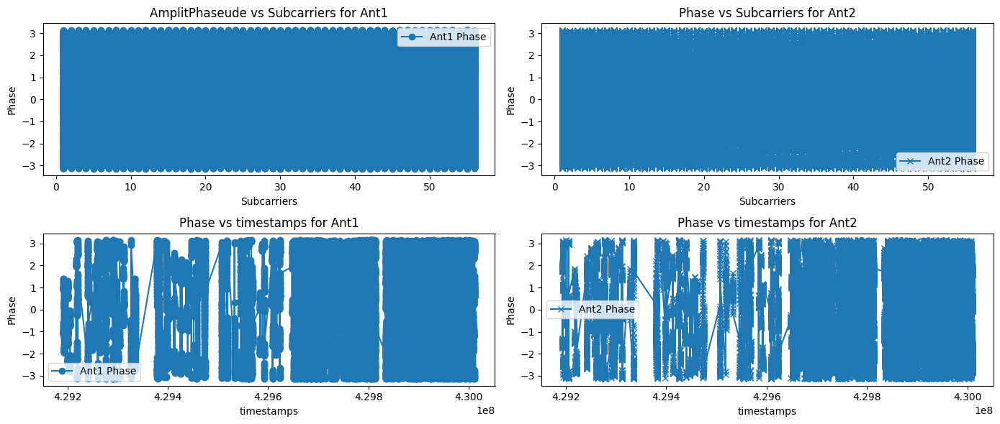

In [18]:
# Create a figure and set of subplots (2 columns)
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Plot for Ant1 Amplitude on the first subplot
ax[0][0].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_phase"], label="Ant1 Phase", marker='o')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Phase")
ax[0][0].set_title("AmplitPhaseude vs Subcarriers for Ant1")
ax[0][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_phase"], label="Ant2 Phase", marker='x')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Phase")
ax[0][1].set_title("Phase vs Subcarriers for Ant2")
ax[0][1].legend()

# Plot for Ant1 Amplitude on the first subplot
ax[1][0].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_phase"], label="Ant1 Phase", marker='o')
ax[1][0].set_xlabel("timestamps")
ax[1][0].set_ylabel("Phase")
ax[1][0].set_title("Phase vs timestamps for Ant1")
ax[1][0].legend()

# Plot for Ant2 Amplitude on the second subplot
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_phase"], label="Ant2 Phase", marker='x')
ax[1][1].set_xlabel("timestamps")
ax[1][1].set_ylabel("Phase")
ax[1][1].set_title("Phase vs timestamps for Ant2")
ax[1][1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

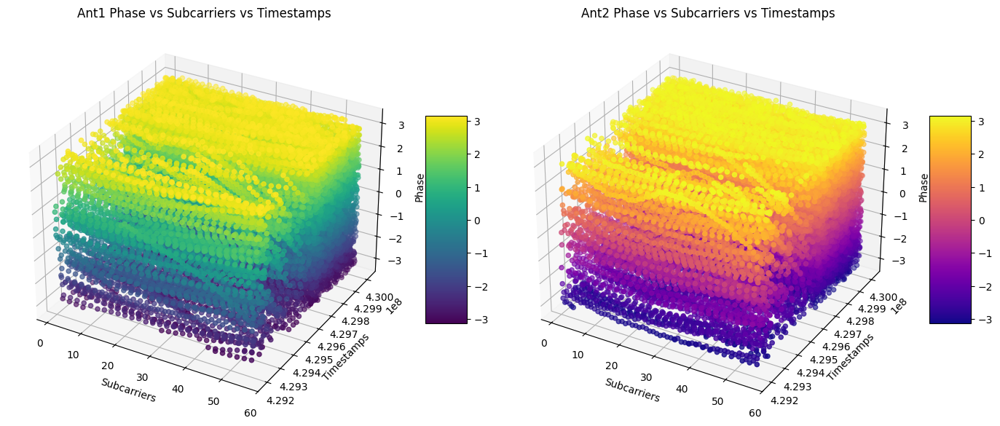

In [19]:
# Create a figure with two subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(14, 6))

# First subplot for Ant1 Phase
ax1 = fig.add_subplot(121, projection='3d')
subcarriers = wo_1_1_0["subcarriers"]
phase_ant1 = wo_1_1_0["ant1_phase"]
timestamps = wo_1_1_0["timestamps"]

# 3D scatter plot for Ant1 Phase
scatter1 = ax1.scatter(subcarriers, timestamps, phase_ant1, c=phase_ant1, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Phase')
ax1.set_title('Ant1 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for Ant2 Phase
ax2 = fig.add_subplot(122, projection='3d')
phase_ant2 = wo_1_1_0["ant2_phase"]

# 3D scatter plot for Ant2 Phase
scatter2 = ax2.scatter(subcarriers, timestamps, phase_ant2, c=phase_ant2, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Phase')
ax2.set_title('Ant2 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

## RSSI

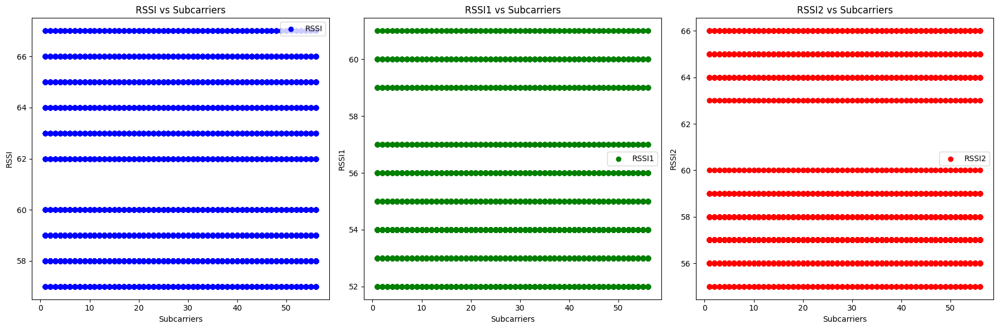

In [20]:
# Create a figure with three subplots for side-by-side 2D scatter plots
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plot RSSI vs Subcarriers in the first subplot
ax[0].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi"], color='blue', label="RSSI")
ax[0].set_xlabel('Subcarriers')
ax[0].set_ylabel('RSSI')
ax[0].set_title('RSSI vs Subcarriers')
ax[0].legend()

# Plot RSSI1 vs Subcarriers in the second subplot
ax[1].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi1"], color='green', label="RSSI1")
ax[1].set_xlabel('Subcarriers')
ax[1].set_ylabel('RSSI1')
ax[1].set_title('RSSI1 vs Subcarriers')
ax[1].legend()

# Plot RSSI2 vs Subcarriers in the third subplot
ax[2].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi2"], color='red', label="RSSI2")
ax[2].set_xlabel('Subcarriers')
ax[2].set_ylabel('RSSI2')
ax[2].set_title('RSSI2 vs Subcarriers')
ax[2].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

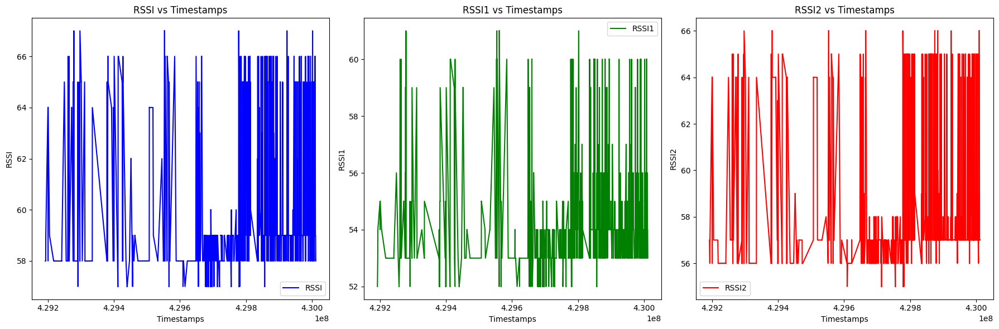

In [21]:
# Create a figure with three subplots for side-by-side 2D scatter plots
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plot RSSI vs Timestamps in the first subplot
ax[0].plot(wo_1_1_0["timestamps"], wo_1_1_0["rssi"], color='blue', label="RSSI")
ax[0].set_xlabel('Timestamps')
ax[0].set_ylabel('RSSI')
ax[0].set_title('RSSI vs Timestamps')
ax[0].legend()

# Plot RSSI1 vs Timestamps in the second subplot
ax[1].plot(wo_1_1_0["timestamps"], wo_1_1_0["rssi1"], color='green', label="RSSI1")
ax[1].set_xlabel('Timestamps')
ax[1].set_ylabel('RSSI1')
ax[1].set_title('RSSI1 vs Timestamps')
ax[1].legend()

# Plot RSSI2 vs Timestamps in the third subplot
ax[2].plot(wo_1_1_0["timestamps"], wo_1_1_0["rssi2"], color='red', label="RSSI2")
ax[2].set_xlabel('Timestamps')
ax[2].set_ylabel('RSSI2')
ax[2].set_title('RSSI2 vs Timestamps')
ax[2].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

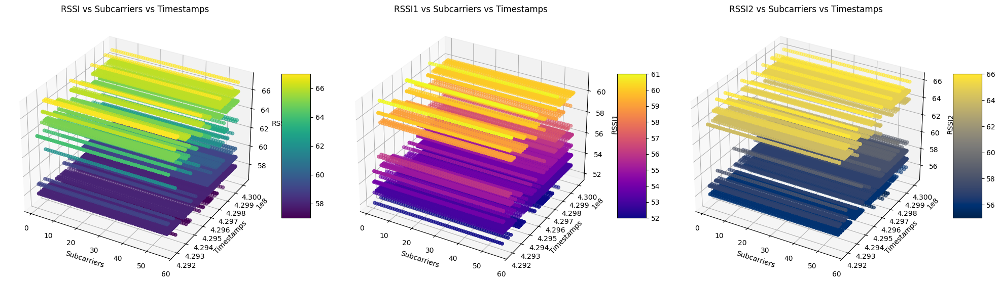

In [22]:
# Create a figure with three subplots for side-by-side 3D scatter plots
fig = plt.figure(figsize=(20, 6))

# First subplot for RSSI
ax1 = fig.add_subplot(131, projection='3d')
subcarriers = wo_1_1_0["subcarriers"]
rssi = wo_1_1_0["rssi"]
timestamps = wo_1_1_0["timestamps"]

# 3D scatter plot for RSSI
scatter1 = ax1.scatter(subcarriers, timestamps, rssi, c=rssi, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('RSSI')
ax1.set_title('RSSI vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot for RSSI1
ax2 = fig.add_subplot(132, projection='3d')
rssi1 = wo_1_1_0["rssi1"]

# 3D scatter plot for RSSI1
scatter2 = ax2.scatter(subcarriers, timestamps, rssi1, c=rssi1, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('RSSI1')
ax2.set_title('RSSI1 vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Third subplot for RSSI2
ax3 = fig.add_subplot(133, projection='3d')
rssi2 = wo_1_1_0["rssi2"]

# 3D scatter plot for RSSI2
scatter3 = ax3.scatter(subcarriers, timestamps, rssi2, c=rssi2, cmap='cividis')
ax3.set_xlabel('Subcarriers')
ax3.set_ylabel('Timestamps')
ax3.set_zlabel('RSSI2')
ax3.set_title('RSSI2 vs Subcarriers vs Timestamps')
fig.colorbar(scatter3, ax=ax3, shrink=0.5, aspect=5)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Compare ((1, 1) vs (7, 6))

In [41]:
wo_7_6_0 = pd.read_csv("data/csv/still/0/wo_7_6_0.csv")

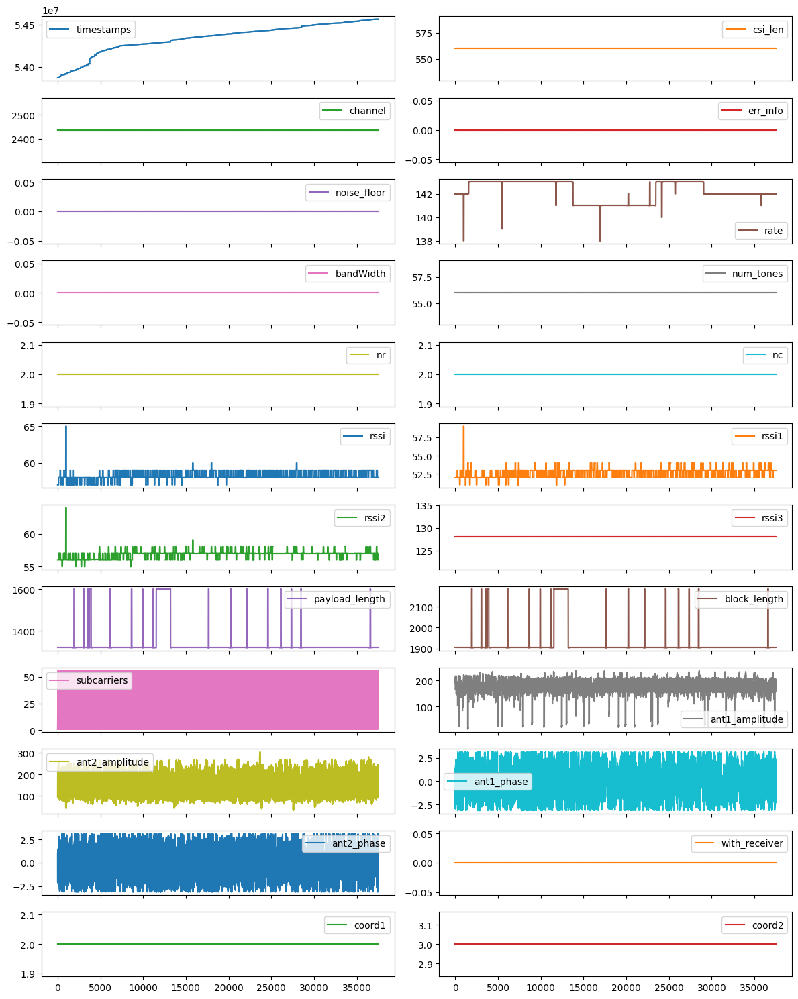

In [42]:
wo_7_6_0.plot(subplots=True, layout=(len(wo_7_6_0.columns)//2, 2), figsize=(12, 15), sharex=True)
plt.tight_layout()
plt.show()

In [43]:
wo_7_6_0.drop(columns=["coord1", "coord2", "with_receiver", "rssi3", "nr", "num_tones", "noise_floor", "channel", "err_info"], inplace=True)
wo_7_6_0.head()

,timestamps,csi_len,rate,bandWidth,nc,rssi,rssi1,rssi2,payload_length,block_length,subcarriers,ant1_amplitude,ant2_amplitude,ant1_phase,ant2_phase
0,53871478,560,142,0,2,57,52,56,1320,1904,1,166.337007,96.213305,-2.823644,0.910665
1,53871478,560,142,0,2,57,52,56,1320,1904,2,169.331037,178.675684,1.404677,-1.883698
2,53871478,560,142,0,2,57,52,56,1320,1904,3,172.122050,97.185390,-2.852918,0.865518
3,53871478,560,142,0,2,57,52,56,1320,1904,4,175.171345,185.520888,1.352127,-1.940292
4,53871478,560,142,0,2,57,52,56,1320,1904,5,187.555325,102.552426,-2.838390,0.764711


## Amplitude

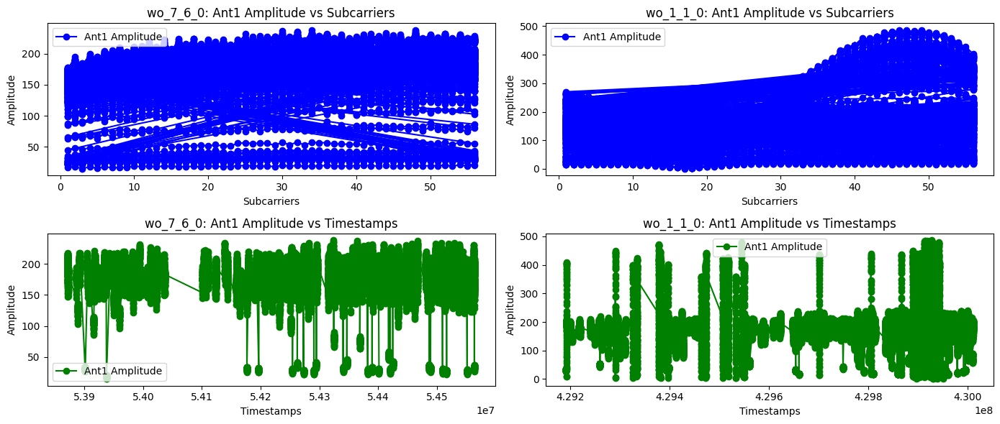

In [44]:
# Create a figure with 2x2 subplots for comparison
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Left column (wo_7_6_0) - Ant1 Amplitude vs Subcarriers
ax[0][0].plot(wo_7_6_0["subcarriers"], wo_7_6_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='blue')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("wo_7_6_0: Ant1 Amplitude vs Subcarriers")
ax[0][0].legend()

# Right column (wo_1_1_0) - Ant1 Amplitude vs Subcarriers
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='blue')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("wo_1_1_0: Ant1 Amplitude vs Subcarriers")
ax[0][1].legend()

# Left column (wo_7_6_0) - Ant1 Amplitude vs Timestamps
ax[1][0].plot(wo_7_6_0["timestamps"], wo_7_6_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='green')
ax[1][0].set_xlabel("Timestamps")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("wo_7_6_0: Ant1 Amplitude vs Timestamps")
ax[1][0].legend()

# Right column (wo_1_1_0) - Ant1 Amplitude vs Timestamps
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='green')
ax[1][1].set_xlabel("Timestamps")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("wo_1_1_0: Ant1 Amplitude vs Timestamps")
ax[1][1].legend()

# Adjust layout and display
plt.tight_layout()
plt.show()

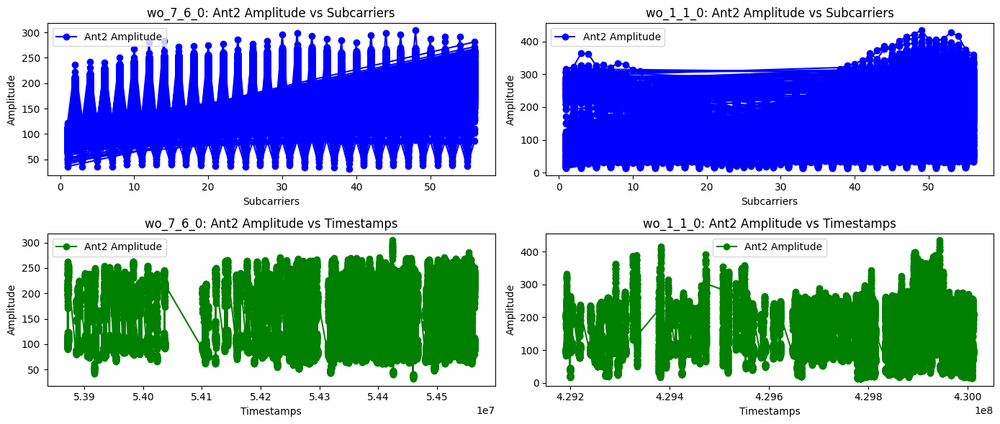

In [45]:
# Create a figure with 2x2 subplots for comparison
fig, ax = plt.subplots(2, 2, figsize=(14, 6))

# Left column (wo_7_6_0) - Ant2 Amplitude vs Subcarriers
ax[0][0].plot(wo_7_6_0["subcarriers"], wo_7_6_0["ant2_amplitude"], label="Ant2 Amplitude", marker='o', color='blue')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("wo_7_6_0: Ant2 Amplitude vs Subcarriers")
ax[0][0].legend()

# Right column (wo_1_1_0) - Ant2 Amplitude vs Subcarriers
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='o', color='blue')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("wo_1_1_0: Ant2 Amplitude vs Subcarriers")
ax[0][1].legend()

# Left column (wo_7_6_0) - Ant2 Amplitude vs Timestamps
ax[1][0].plot(wo_7_6_0["timestamps"], wo_7_6_0["ant2_amplitude"], label="Ant2 Amplitude", marker='o', color='green')
ax[1][0].set_xlabel("Timestamps")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("wo_7_6_0: Ant2 Amplitude vs Timestamps")
ax[1][0].legend()

# Right column (wo_1_1_0) - Ant2 Amplitude vs Timestamps
ax[1][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='o', color='green')
ax[1][1].set_xlabel("Timestamps")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("wo_1_1_0: Ant2 Amplitude vs Timestamps")
ax[1][1].legend()

# Adjust layout and display
plt.tight_layout()
plt.show()

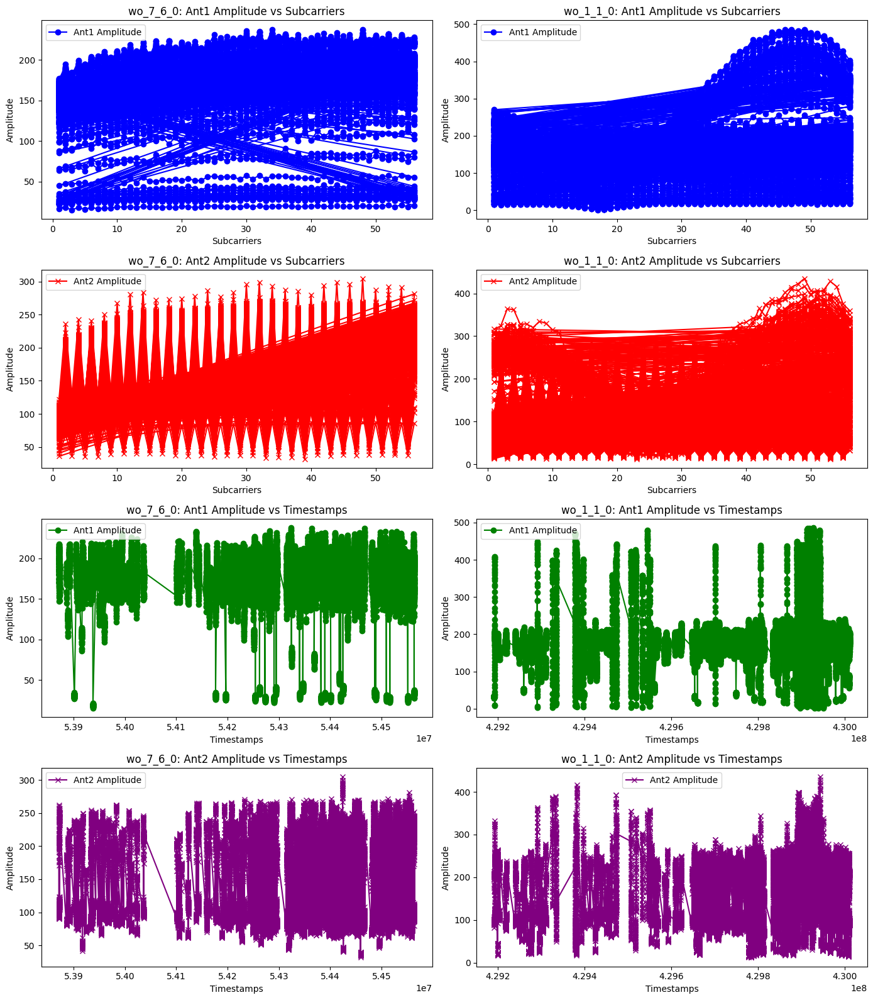

In [46]:
# Create a figure with 4 rows and 2 columns for comparison
fig, ax = plt.subplots(4, 2, figsize=(14, 16))

# First row: Ant1 Amplitude vs Subcarriers
# Left column: wo_7_6_0 Ant1 Amplitude vs Subcarriers
ax[0][0].plot(wo_7_6_0["subcarriers"], wo_7_6_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='blue')
ax[0][0].set_xlabel("Subcarriers")
ax[0][0].set_ylabel("Amplitude")
ax[0][0].set_title("wo_7_6_0: Ant1 Amplitude vs Subcarriers")
ax[0][0].legend()

# Right column: wo_1_1_0 Ant1 Amplitude vs Subcarriers
ax[0][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='blue')
ax[0][1].set_xlabel("Subcarriers")
ax[0][1].set_ylabel("Amplitude")
ax[0][1].set_title("wo_1_1_0: Ant1 Amplitude vs Subcarriers")
ax[0][1].legend()

# Second row: Ant2 Amplitude vs Subcarriers
# Left column: wo_7_6_0 Ant2 Amplitude vs Subcarriers
ax[1][0].plot(wo_7_6_0["subcarriers"], wo_7_6_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x', color='red')
ax[1][0].set_xlabel("Subcarriers")
ax[1][0].set_ylabel("Amplitude")
ax[1][0].set_title("wo_7_6_0: Ant2 Amplitude vs Subcarriers")
ax[1][0].legend()

# Right column: wo_1_1_0 Ant2 Amplitude vs Subcarriers
ax[1][1].plot(wo_1_1_0["subcarriers"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x', color='red')
ax[1][1].set_xlabel("Subcarriers")
ax[1][1].set_ylabel("Amplitude")
ax[1][1].set_title("wo_1_1_0: Ant2 Amplitude vs Subcarriers")
ax[1][1].legend()

# Third row: Ant1 Amplitude vs Timestamps
# Left column: wo_7_6_0 Ant1 Amplitude vs Timestamps
ax[2][0].plot(wo_7_6_0["timestamps"], wo_7_6_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='green')
ax[2][0].set_xlabel("Timestamps")
ax[2][0].set_ylabel("Amplitude")
ax[2][0].set_title("wo_7_6_0: Ant1 Amplitude vs Timestamps")
ax[2][0].legend()

# Right column: wo_1_1_0 Ant1 Amplitude vs Timestamps
ax[2][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant1_amplitude"], label="Ant1 Amplitude", marker='o', color='green')
ax[2][1].set_xlabel("Timestamps")
ax[2][1].set_ylabel("Amplitude")
ax[2][1].set_title("wo_1_1_0: Ant1 Amplitude vs Timestamps")
ax[2][1].legend()

# Fourth row: Ant2 Amplitude vs Timestamps
# Left column: wo_7_6_0 Ant2 Amplitude vs Timestamps
ax[3][0].plot(wo_7_6_0["timestamps"], wo_7_6_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x', color='purple')
ax[3][0].set_xlabel("Timestamps")
ax[3][0].set_ylabel("Amplitude")
ax[3][0].set_title("wo_7_6_0: Ant2 Amplitude vs Timestamps")
ax[3][0].legend()

# Right column: wo_1_1_0 Ant2 Amplitude vs Timestamps
ax[3][1].plot(wo_1_1_0["timestamps"], wo_1_1_0["ant2_amplitude"], label="Ant2 Amplitude", marker='x', color='purple')
ax[3][1].set_xlabel("Timestamps")
ax[3][1].set_ylabel("Amplitude")
ax[3][1].set_title("wo_1_1_0: Ant2 Amplitude vs Timestamps")
ax[3][1].legend()

# Adjust layout and display
plt.tight_layout()
plt.show()


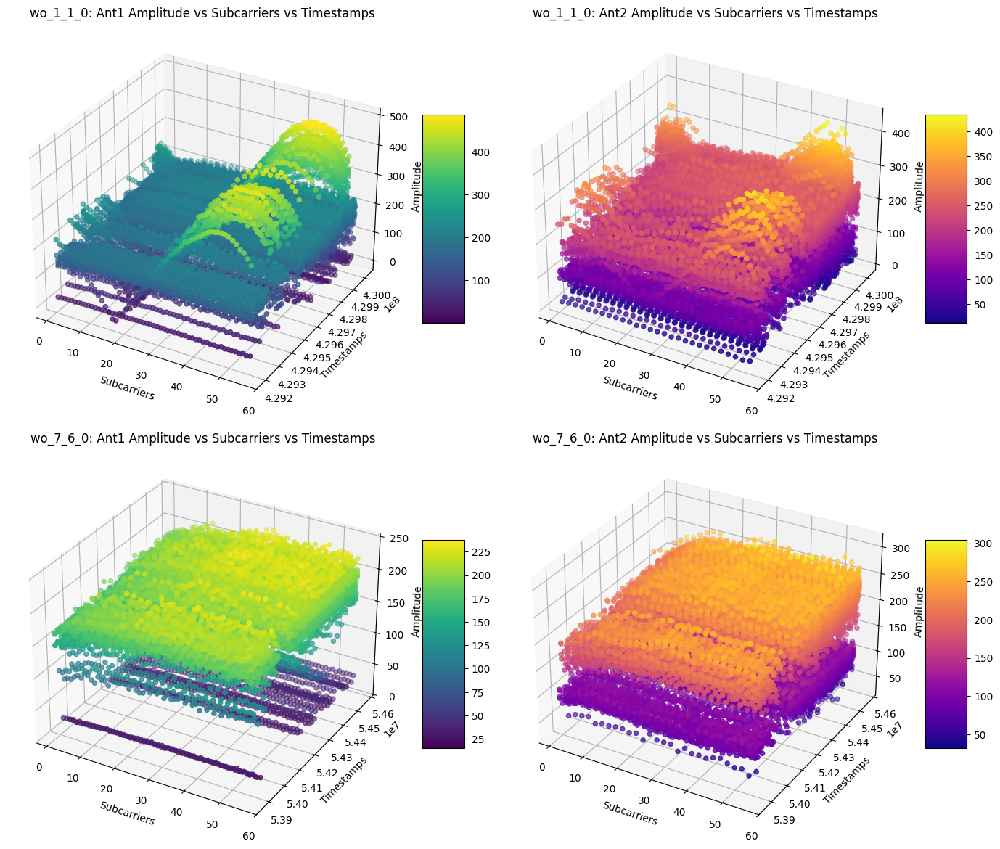

In [47]:

# Create a figure with 2x2 subplots for 3D scatter plots
fig = plt.figure(figsize=(14, 12))

# First subplot (top-left) for wo_1_1_0 Ant1 Amplitude
ax1 = fig.add_subplot(221, projection='3d')
subcarriers_1_1_0 = wo_1_1_0["subcarriers"]
amplitude_ant1_1_1_0 = wo_1_1_0["ant1_amplitude"]
timestamps_1_1_0 = wo_1_1_0["timestamps"]

# 3D scatter plot for wo_1_1_0 Ant1
scatter1 = ax1.scatter(subcarriers_1_1_0, timestamps_1_1_0, amplitude_ant1_1_1_0, c=amplitude_ant1_1_1_0, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Amplitude')
ax1.set_title('wo_1_1_0: Ant1 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot (top-right) for wo_1_1_0 Ant2 Amplitude
ax2 = fig.add_subplot(222, projection='3d')
amplitude_ant2_1_1_0 = wo_1_1_0["ant2_amplitude"]

# 3D scatter plot for wo_1_1_0 Ant2
scatter2 = ax2.scatter(subcarriers_1_1_0, timestamps_1_1_0, amplitude_ant2_1_1_0, c=amplitude_ant2_1_1_0, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Amplitude')
ax2.set_title('wo_1_1_0: Ant2 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Third subplot (bottom-left) for wo_7_6_0 Ant1 Amplitude
ax3 = fig.add_subplot(223, projection='3d')
subcarriers_7_6_0 = wo_7_6_0["subcarriers"]
amplitude_ant1_7_6_0 = wo_7_6_0["ant1_amplitude"]
timestamps_7_6_0 = wo_7_6_0["timestamps"]

# 3D scatter plot for wo_7_6_0 Ant1
scatter3 = ax3.scatter(subcarriers_7_6_0, timestamps_7_6_0, amplitude_ant1_7_6_0, c=amplitude_ant1_7_6_0, cmap='viridis')
ax3.set_xlabel('Subcarriers')
ax3.set_ylabel('Timestamps')
ax3.set_zlabel('Amplitude')
ax3.set_title('wo_7_6_0: Ant1 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter3, ax=ax3, shrink=0.5, aspect=5)

# Fourth subplot (bottom-right) for wo_7_6_0 Ant2 Amplitude
ax4 = fig.add_subplot(224, projection='3d')
amplitude_ant2_7_6_0 = wo_7_6_0["ant2_amplitude"]

# 3D scatter plot for wo_7_6_0 Ant2
scatter4 = ax4.scatter(subcarriers_7_6_0, timestamps_7_6_0, amplitude_ant2_7_6_0, c=amplitude_ant2_7_6_0, cmap='plasma')
ax4.set_xlabel('Subcarriers')
ax4.set_ylabel('Timestamps')
ax4.set_zlabel('Amplitude')
ax4.set_title('wo_7_6_0: Ant2 Amplitude vs Subcarriers vs Timestamps')
fig.colorbar(scatter4, ax=ax4, shrink=0.5, aspect=5)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## Phase

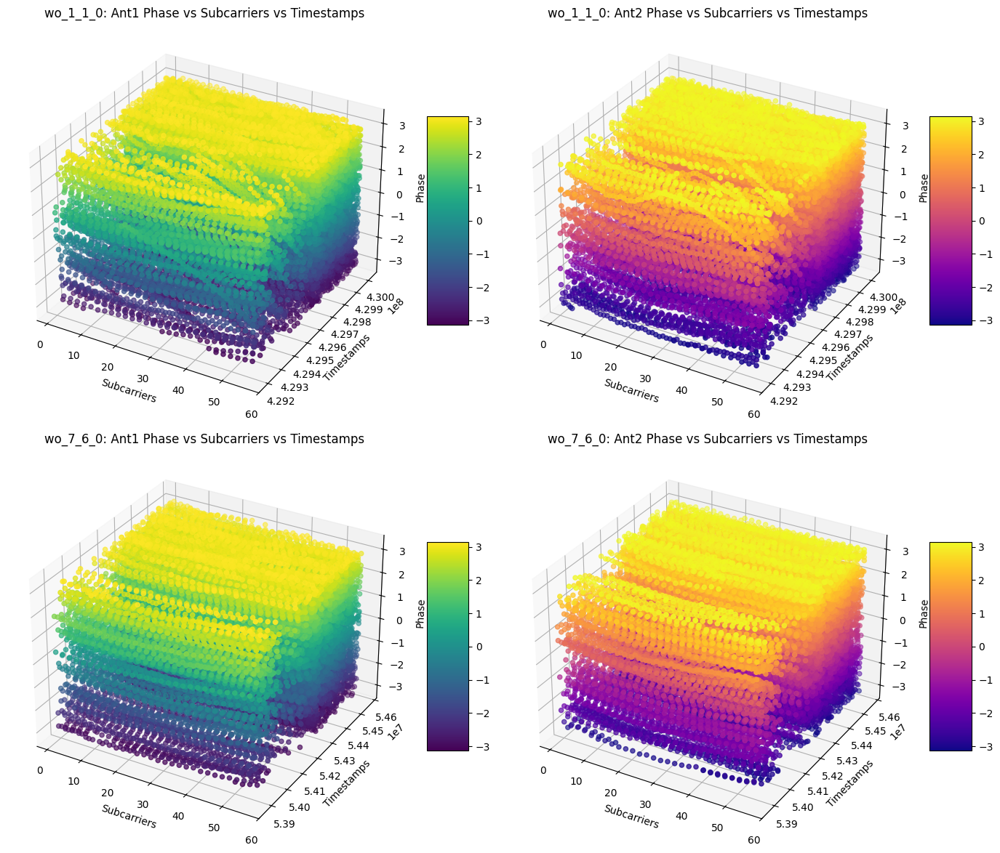

In [48]:
# Create a figure with 2x2 subplots for 3D scatter plots
fig = plt.figure(figsize=(14, 12))

# First subplot (top-left) for wo_1_1_0 Ant1 Phase
ax1 = fig.add_subplot(221, projection='3d')
subcarriers_1_1_0 = wo_1_1_0["subcarriers"]
phase_ant1_1_1_0 = wo_1_1_0["ant1_phase"]
timestamps_1_1_0 = wo_1_1_0["timestamps"]

# 3D scatter plot for wo_1_1_0 Ant1 Phase
scatter1 = ax1.scatter(subcarriers_1_1_0, timestamps_1_1_0, phase_ant1_1_1_0, c=phase_ant1_1_1_0, cmap='viridis')
ax1.set_xlabel('Subcarriers')
ax1.set_ylabel('Timestamps')
ax1.set_zlabel('Phase')
ax1.set_title('wo_1_1_0: Ant1 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter1, ax=ax1, shrink=0.5, aspect=5)

# Second subplot (top-right) for wo_1_1_0 Ant2 Phase
ax2 = fig.add_subplot(222, projection='3d')
phase_ant2_1_1_0 = wo_1_1_0["ant2_phase"]

# 3D scatter plot for wo_1_1_0 Ant2 Phase
scatter2 = ax2.scatter(subcarriers_1_1_0, timestamps_1_1_0, phase_ant2_1_1_0, c=phase_ant2_1_1_0, cmap='plasma')
ax2.set_xlabel('Subcarriers')
ax2.set_ylabel('Timestamps')
ax2.set_zlabel('Phase')
ax2.set_title('wo_1_1_0: Ant2 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter2, ax=ax2, shrink=0.5, aspect=5)

# Third subplot (bottom-left) for wo_7_6_0 Ant1 Phase
ax3 = fig.add_subplot(223, projection='3d')
subcarriers_7_6_0 = wo_7_6_0["subcarriers"]
phase_ant1_7_6_0 = wo_7_6_0["ant1_phase"]
timestamps_7_6_0 = wo_7_6_0["timestamps"]

# 3D scatter plot for wo_7_6_0 Ant1 Phase
scatter3 = ax3.scatter(subcarriers_7_6_0, timestamps_7_6_0, phase_ant1_7_6_0, c=phase_ant1_7_6_0, cmap='viridis')
ax3.set_xlabel('Subcarriers')
ax3.set_ylabel('Timestamps')
ax3.set_zlabel('Phase')
ax3.set_title('wo_7_6_0: Ant1 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter3, ax=ax3, shrink=0.5, aspect=5)

# Fourth subplot (bottom-right) for wo_7_6_0 Ant2 Phase
ax4 = fig.add_subplot(224, projection='3d')
phase_ant2_7_6_0 = wo_7_6_0["ant2_phase"]

# 3D scatter plot for wo_7_6_0 Ant2 Phase
scatter4 = ax4.scatter(subcarriers_7_6_0, timestamps_7_6_0, phase_ant2_7_6_0, c=phase_ant2_7_6_0, cmap='plasma')
ax4.set_xlabel('Subcarriers')
ax4.set_ylabel('Timestamps')
ax4.set_zlabel('Phase')
ax4.set_title('wo_7_6_0: Ant2 Phase vs Subcarriers vs Timestamps')
fig.colorbar(scatter4, ax=ax4, shrink=0.5, aspect=5)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## RSSI

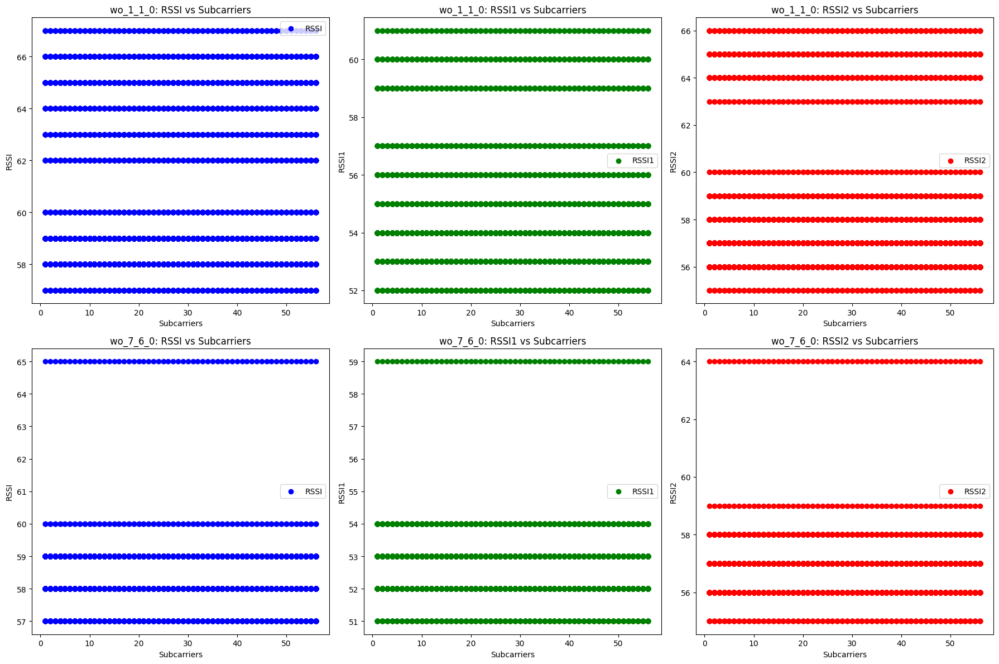

In [49]:
# Create a figure with 2 rows and 3 columns for comparison
fig, ax = plt.subplots(2, 3, figsize=(18, 12))

# Top row: wo_1_1_0 dataset

# Plot RSSI vs Subcarriers in the first subplot (top-left)
ax[0][0].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi"], color='blue', label="RSSI")
ax[0][0].set_xlabel('Subcarriers')
ax[0][0].set_ylabel('RSSI')
ax[0][0].set_title('wo_1_1_0: RSSI vs Subcarriers')
ax[0][0].legend()

# Plot RSSI1 vs Subcarriers in the second subplot (top-middle)
ax[0][1].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi1"], color='green', label="RSSI1")
ax[0][1].set_xlabel('Subcarriers')
ax[0][1].set_ylabel('RSSI1')
ax[0][1].set_title('wo_1_1_0: RSSI1 vs Subcarriers')
ax[0][1].legend()

# Plot RSSI2 vs Subcarriers in the third subplot (top-right)
ax[0][2].scatter(wo_1_1_0["subcarriers"], wo_1_1_0["rssi2"], color='red', label="RSSI2")
ax[0][2].set_xlabel('Subcarriers')
ax[0][2].set_ylabel('RSSI2')
ax[0][2].set_title('wo_1_1_0: RSSI2 vs Subcarriers')
ax[0][2].legend()

# Bottom row: wo_7_6_0 dataset

# Plot RSSI vs Subcarriers in the first subplot (bottom-left)
ax[1][0].scatter(wo_7_6_0["subcarriers"], wo_7_6_0["rssi"], color='blue', label="RSSI")
ax[1][0].set_xlabel('Subcarriers')
ax[1][0].set_ylabel('RSSI')
ax[1][0].set_title('wo_7_6_0: RSSI vs Subcarriers')
ax[1][0].legend()

# Plot RSSI1 vs Subcarriers in the second subplot (bottom-middle)
ax[1][1].scatter(wo_7_6_0["subcarriers"], wo_7_6_0["rssi1"], color='green', label="RSSI1")
ax[1][1].set_xlabel('Subcarriers')
ax[1][1].set_ylabel('RSSI1')
ax[1][1].set_title('wo_7_6_0: RSSI1 vs Subcarriers')
ax[1][1].legend()

# Plot RSSI2 vs Subcarriers in the third subplot (bottom-right)
ax[1][2].scatter(wo_7_6_0["subcarriers"], wo_7_6_0["rssi2"], color='red', label="RSSI2")
ax[1][2].set_xlabel('Subcarriers')
ax[1][2].set_ylabel('RSSI2')
ax[1][2].set_title('wo_7_6_0: RSSI2 vs Subcarriers')
ax[1][2].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

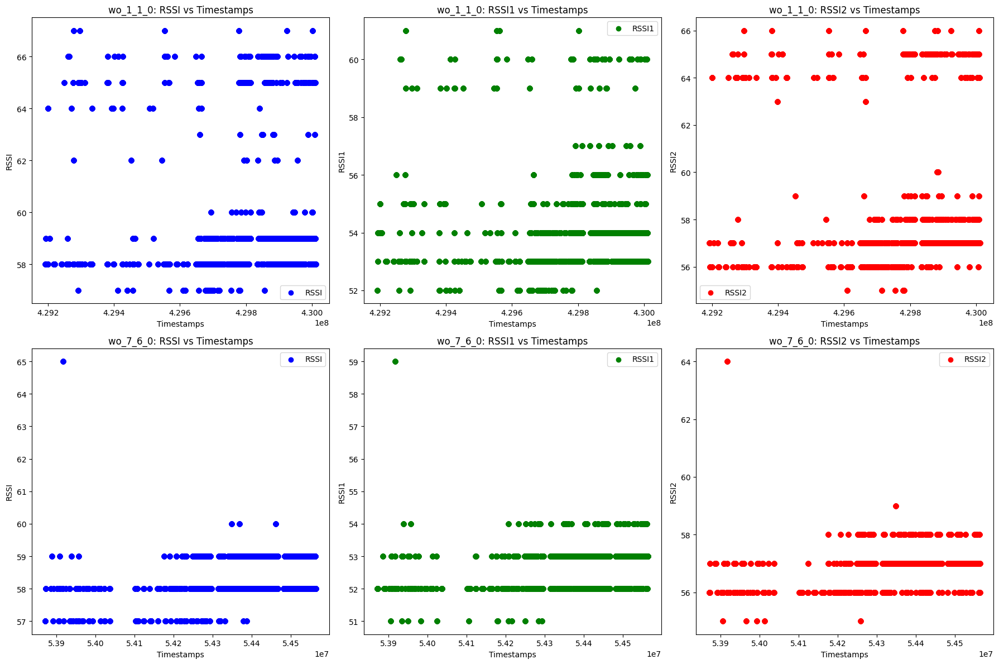

In [50]:
# Create a figure with 2 rows and 3 columns for comparison
fig, ax = plt.subplots(2, 3, figsize=(18, 12))

# Top row: wo_1_1_0 dataset

# Plot RSSI vs Timestamps in the first subplot (top-left)
ax[0][0].scatter(wo_1_1_0["timestamps"], wo_1_1_0["rssi"], color='blue', label="RSSI")
ax[0][0].set_xlabel('Timestamps')
ax[0][0].set_ylabel('RSSI')
ax[0][0].set_title('wo_1_1_0: RSSI vs Timestamps')
ax[0][0].legend()

# Plot RSSI1 vs Timestamps in the second subplot (top-middle)
ax[0][1].scatter(wo_1_1_0["timestamps"], wo_1_1_0["rssi1"], color='green', label="RSSI1")
ax[0][1].set_xlabel('Timestamps')
ax[0][1].set_ylabel('RSSI1')
ax[0][1].set_title('wo_1_1_0: RSSI1 vs Timestamps')
ax[0][1].legend()

# Plot RSSI2 vs Timestamps in the third subplot (top-right)
ax[0][2].scatter(wo_1_1_0["timestamps"], wo_1_1_0["rssi2"], color='red', label="RSSI2")
ax[0][2].set_xlabel('Timestamps')
ax[0][2].set_ylabel('RSSI2')
ax[0][2].set_title('wo_1_1_0: RSSI2 vs Timestamps')
ax[0][2].legend()

# Bottom row: wo_7_6_0 dataset

# Plot RSSI vs Timestamps in the first subplot (bottom-left)
ax[1][0].scatter(wo_7_6_0["timestamps"], wo_7_6_0["rssi"], color='blue', label="RSSI")
ax[1][0].set_xlabel('Timestamps')
ax[1][0].set_ylabel('RSSI')
ax[1][0].set_title('wo_7_6_0: RSSI vs Timestamps')
ax[1][0].legend()

# Plot RSSI1 vs Timestamps in the second subplot (bottom-middle)
ax[1][1].scatter(wo_7_6_0["timestamps"], wo_7_6_0["rssi1"], color='green', label="RSSI1")
ax[1][1].set_xlabel('Timestamps')
ax[1][1].set_ylabel('RSSI1')
ax[1][1].set_title('wo_7_6_0: RSSI1 vs Timestamps')
ax[1][1].legend()

# Plot RSSI2 vs Timestamps in the third subplot (bottom-right)
ax[1][2].scatter(wo_7_6_0["timestamps"], wo_7_6_0["rssi2"], color='red', label="RSSI2")
ax[1][2].set_xlabel('Timestamps')
ax[1][2].set_ylabel('RSSI2')
ax[1][2].set_title('wo_7_6_0: RSSI2 vs Timestamps')
ax[1][2].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Filter

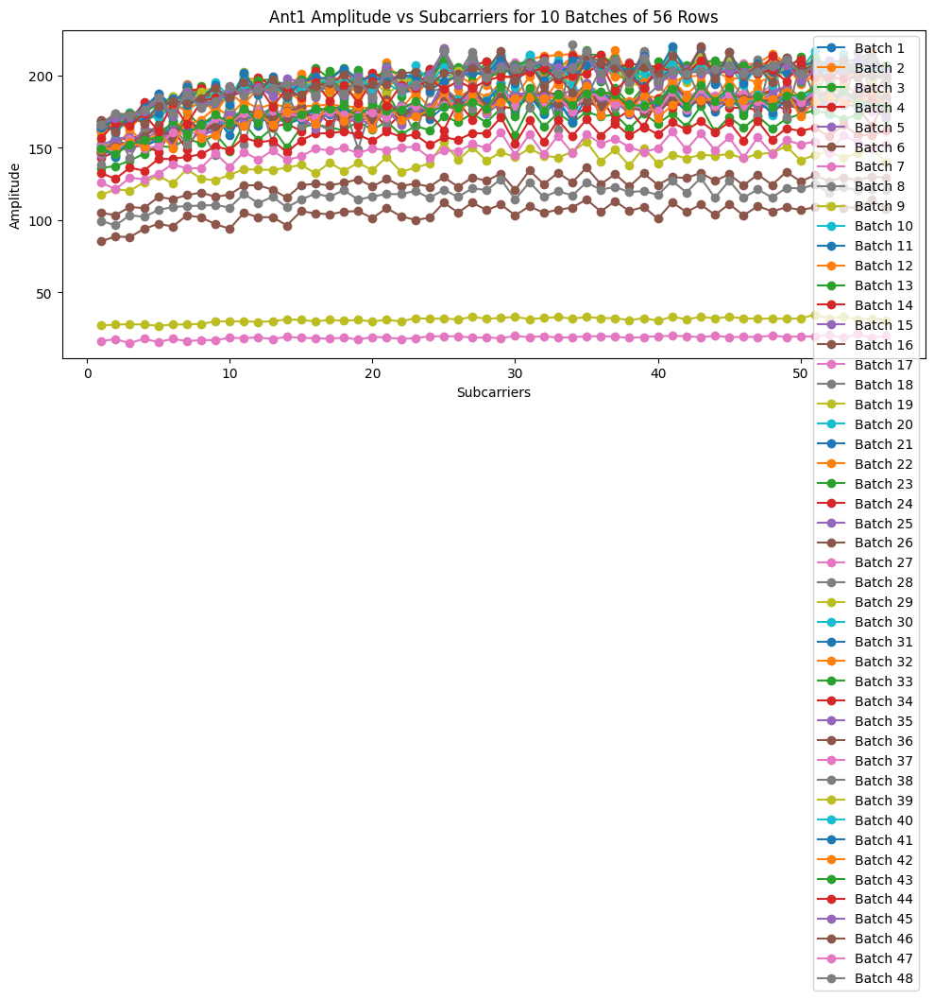

In [51]:
plt.figure(figsize=(10, 8))

# Plot 10 graphs, each containing 56 rows of data
for i in range(48):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_7_6_0["subcarriers"][start:end]
    amplitude_batch = wo_7_6_0["ant1_amplitude"][start:end]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for 10 Batches of 56 Rows")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

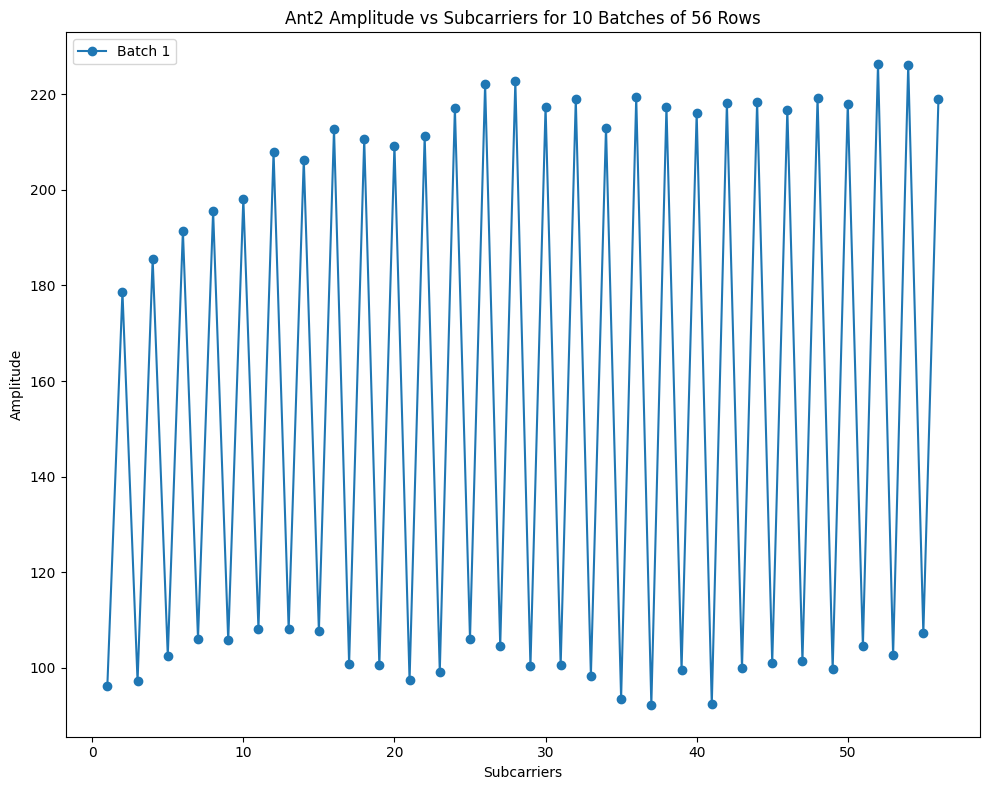

In [62]:
plt.figure(figsize=(10, 8))

# Plot 10 graphs, each containing 56 rows of data
for i in range(1):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_7_6_0["subcarriers"][start:end]
    amplitude_batch = wo_7_6_0["ant2_amplitude"][start:end]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant2 Amplitude vs Subcarriers for 10 Batches of 56 Rows")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

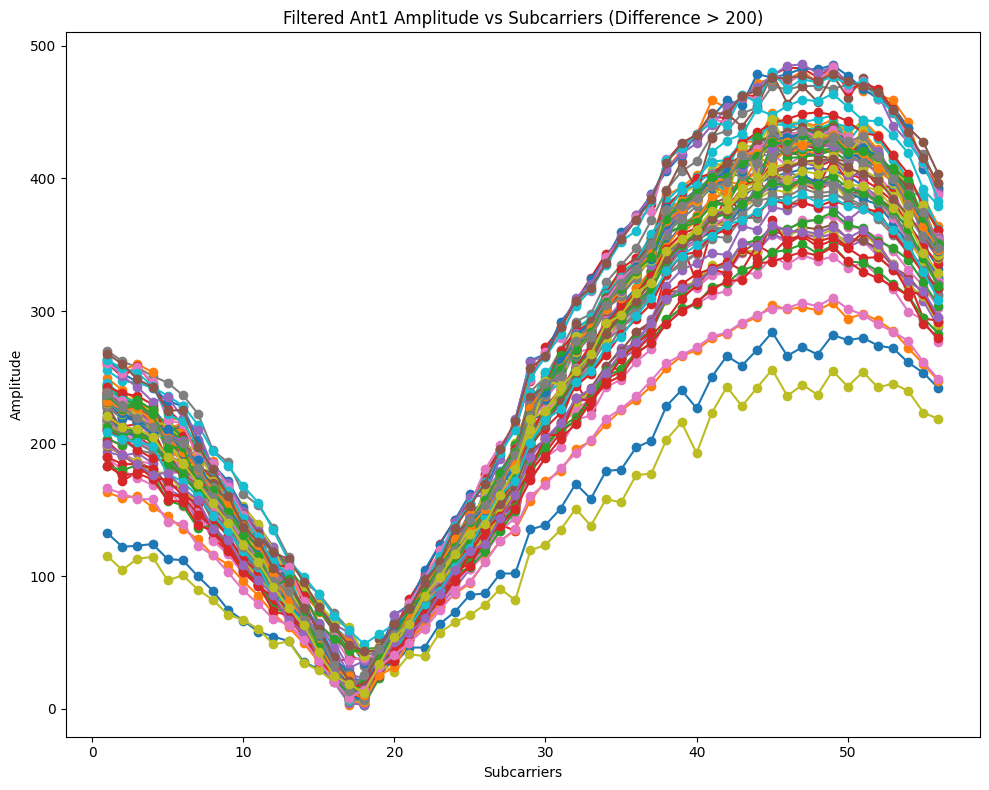

In [52]:
plt.figure(figsize=(10, 8))

# Loop through batches of 56 rows
for i in range(len(wo_1_1_0) // 56):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_1_1_0["subcarriers"][start:end]
    amplitude_batch = wo_1_1_0["ant1_amplitude"][start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = amplitude_batch.max() - amplitude_batch.min()
    
    # Filter: only plot batches where the difference is larger than 200
    if amplitude_range >= 100:
        plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Filtered Ant1 Amplitude vs Subcarriers (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

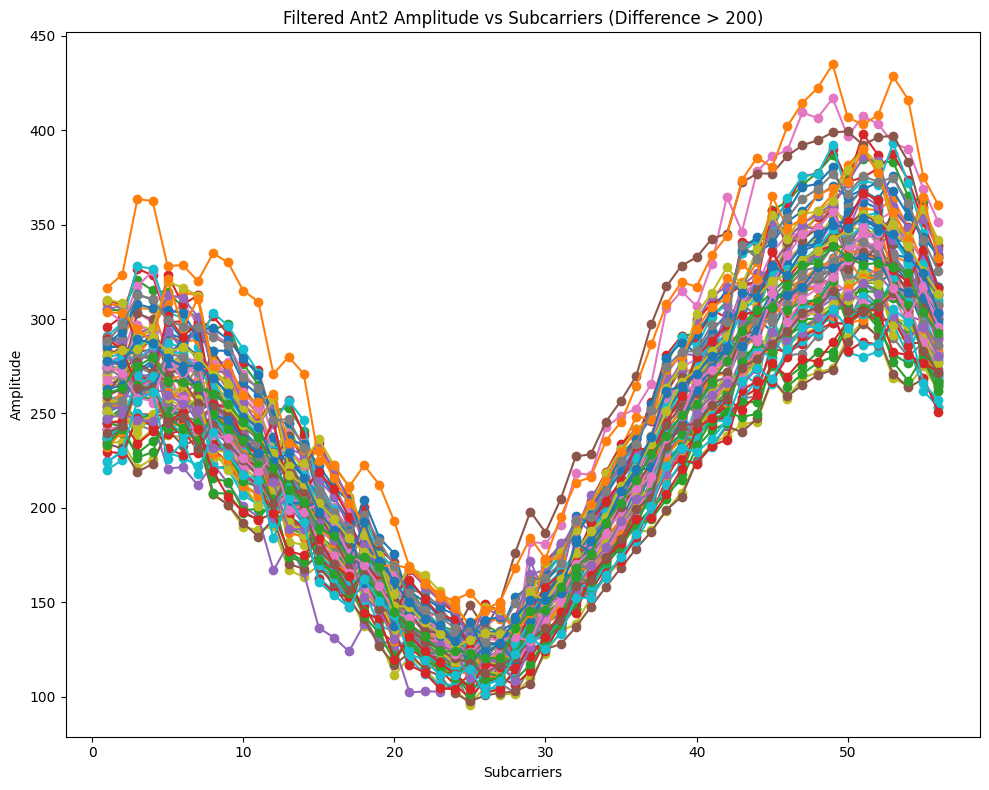

In [53]:
plt.figure(figsize=(10, 8))

# Loop through batches of 56 rows
for i in range(len(wo_1_1_0) // 56):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_1_1_0["subcarriers"][start:end]
    amplitude_batch = wo_1_1_0["ant2_amplitude"][start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = amplitude_batch.max() - amplitude_batch.min()
    
    # Filter: only plot batches where the difference is larger than 200
    if amplitude_range >= 200:
        plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Filtered Ant2 Amplitude vs Subcarriers (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

/tmp/ipykernel_10475/991950205.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


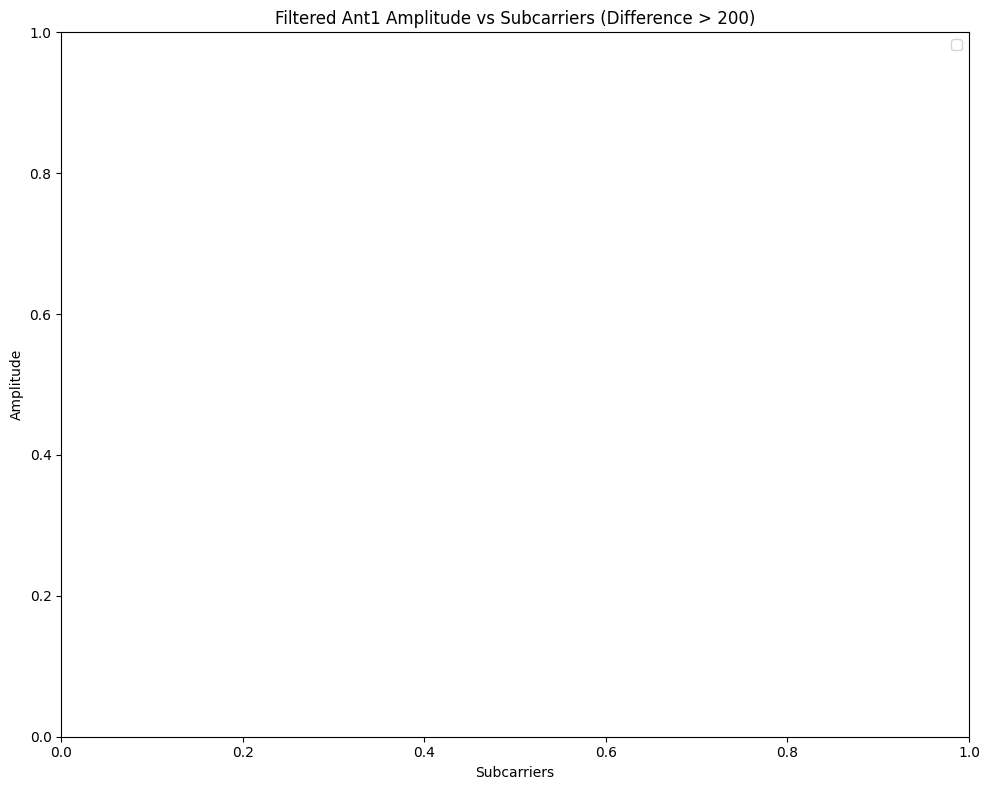

In [54]:
plt.figure(figsize=(10, 8))

# Loop through batches of 56 rows
for i in range(len(wo_7_6_0) // 56):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_7_6_0["subcarriers"][start:end]
    amplitude_batch = wo_7_6_0["ant1_amplitude"][start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = amplitude_batch.max() - amplitude_batch.min()
    
    # Filter: only plot batches where the difference is larger than 200
    if amplitude_range >= 100:
        plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Filtered Ant1 Amplitude vs Subcarriers (Difference > 200)")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

/tmp/ipykernel_10475/3144297228.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


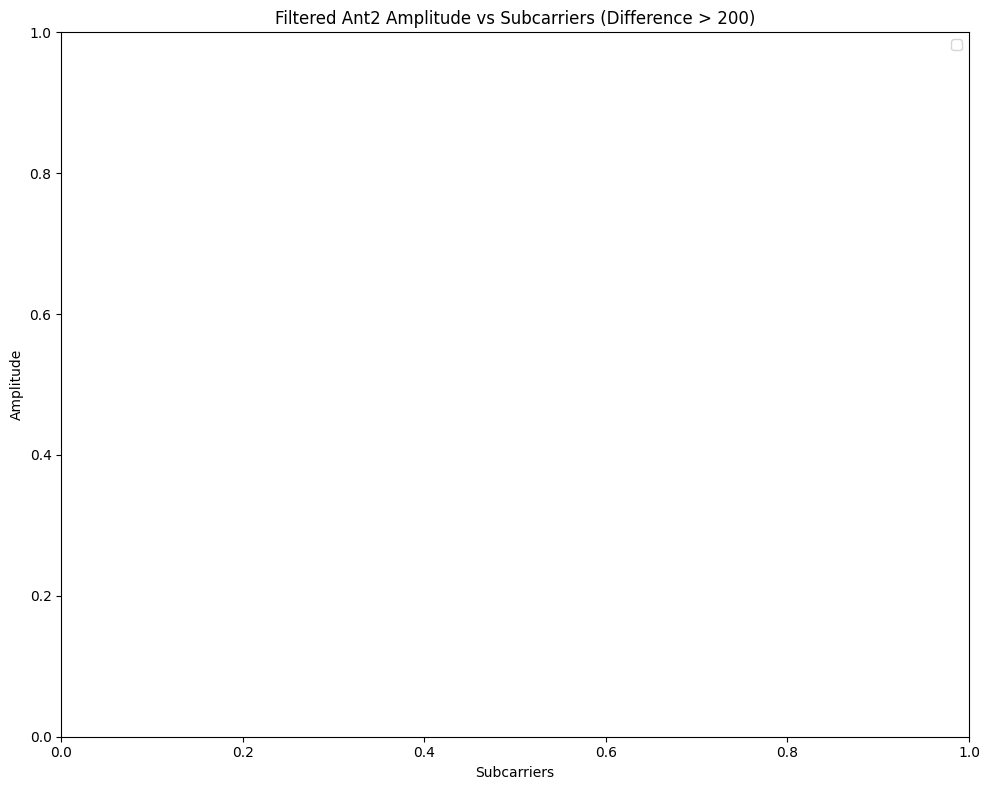

In [55]:
plt.figure(figsize=(10, 8))

# Loop through batches of 56 rows
for i in range(len(wo_7_6_0) // 56):
    start = i * 56
    end = start + 56
    subcarriers_batch = wo_7_6_0["subcarriers"][start:end]
    amplitude_batch = wo_7_6_0["ant2_amplitude"][start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    amplitude_range = amplitude_batch.max() - amplitude_batch.min()
    
    # Filter: only plot batches where the difference is larger than 200
    if amplitude_range >= 200:
        plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i+1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Filtered Ant2 Amplitude vs Subcarriers (Difference > 200)")
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [56]:
# Create an empty DataFrame to hold the valid batches
valid_batches_df = pd.DataFrame()

# Loop through batches of 56 rows
for i in range(len(wo_1_1_0) // 56):
    start = i * 56
    end = start + 56
    
    # Extract the full batch (all columns)
    batch = wo_1_1_0.iloc[start:end]
    
    # Calculate the difference between maximum and minimum amplitude in the batch
    ant1_amplitude_range = batch["ant1_amplitude"].max() - batch["ant1_amplitude"].min()
    ant2_amplitude_range = batch["ant2_amplitude"].max() - batch["ant2_amplitude"].min()
    
    # Filter: only keep batches where the difference is larger than 200
    if ant1_amplitude_range >= 200 and ant2_amplitude_range >= 100:
        # Append valid batches to the DataFrame
        valid_batches_df = pd.concat([valid_batches_df, batch], ignore_index=True)

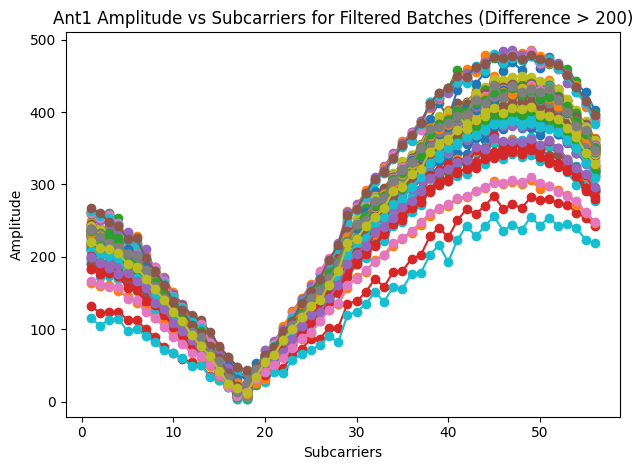

In [57]:
for i in range(0, len(valid_batches_df), 56):
    subcarriers_batch = valid_batches_df["subcarriers"][i:i+56]
    amplitude_batch = valid_batches_df["ant1_amplitude"][i:i+56]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i//56 + 1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant1 Amplitude vs Subcarriers for Filtered Batches (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

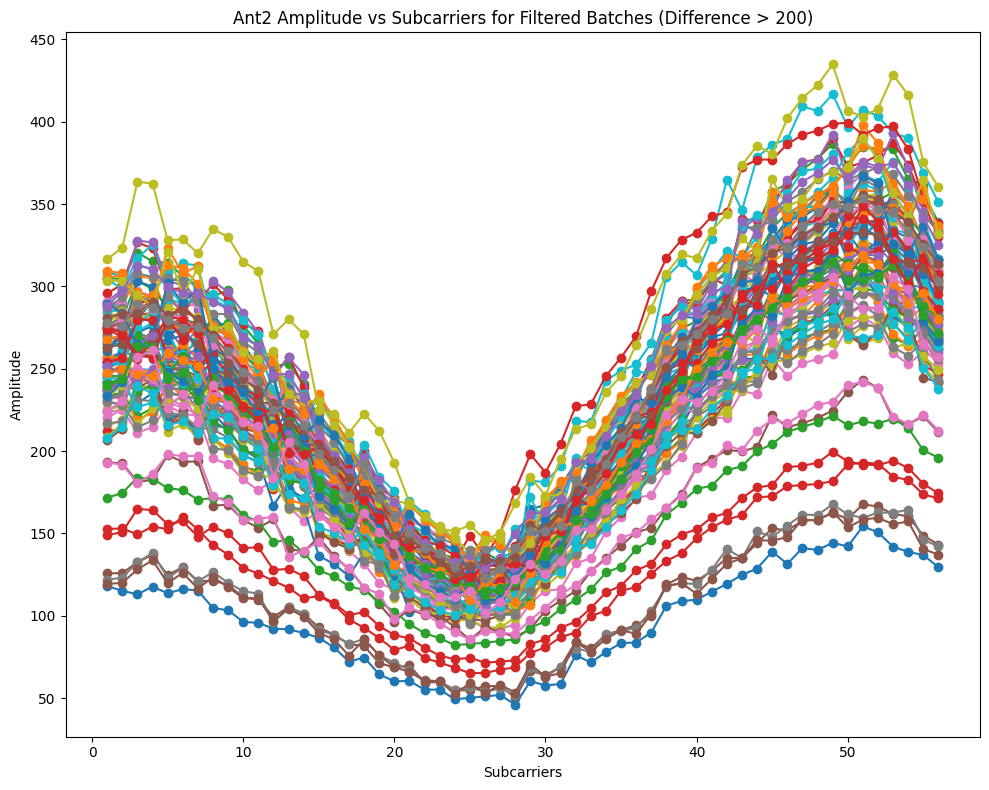

In [58]:
plt.figure(figsize=(10, 8))

for i in range(0, len(valid_batches_df), 56):
    subcarriers_batch = valid_batches_df["subcarriers"][i:i+56]
    amplitude_batch = valid_batches_df["ant2_amplitude"][i:i+56]
    
    plt.plot(subcarriers_batch, amplitude_batch, label=f"Batch {i//56 + 1}", marker='o')

# Adding labels and title
plt.xlabel("Subcarriers")
plt.ylabel("Amplitude")
plt.title("Ant2 Amplitude vs Subcarriers for Filtered Batches (Difference > 200)")
# plt.legend()

# Show the plot
plt.tight_layout()
plt.show()